In [1]:
import numpy as np 
import pandas as pd
import re
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.model_selection import train_test_split
from scipy import special
from tqdm import tqdm
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.impute import SimpleImputer 
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, f1_score, classification_report, accuracy_score, roc_curve
import matplotlib.pyplot as plt
import optuna
from sklearn.model_selection import cross_val_score
from lightgbm import LGBMClassifier, LGBMRegressor
import lightgbm as lgb
from sklearn.metrics import roc_auc_score, classification_report
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.feature_selection import RFE
from boruta import BorutaPy

warnings.filterwarnings("ignore", category=pd.errors.PerformanceWarning)

pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:20,.2f}'.format)

In [2]:
X_train = pd.read_csv('/Users/sakshamjain/Desktop/Projects/JAIN-WIN/feature selection nbs/X_train_GA_final.csv')
y_train = pd.read_csv('/Users/sakshamjain/Desktop/Projects/JAIN-WIN/y_train_large.csv').squeeze()
X_test = pd.read_csv('/Users/sakshamjain/Desktop/Projects/JAIN-WIN/feature selection nbs/X_test_GA_final.csv')
y_test = pd.read_csv('/Users/sakshamjain/Desktop/Projects/JAIN-WIN/y_test_large.csv').squeeze()

In [3]:
# 1. Import Necessary Libraries
import numpy as np
import pandas as pd

from sklearn.ensemble import StackingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, roc_curve, classification_report
from sklearn.preprocessing import StandardScaler

import xgboost as xgb
import lightgbm as lgb
import catboost as cb

import matplotlib.pyplot as plt
import seaborn as sns

print("Training data shape:", X_train.shape)
print("Training labels shape:", y_train.shape)
print("Testing data shape:", X_test.shape)
print("Testing labels shape:", y_test.shape)


Training data shape: (91109, 319)
Training labels shape: (91109,)
Testing data shape: (39048, 319)
Testing labels shape: (39048,)



Training the Stacked Ensemble...
[LightGBM] [Warning] min_data_in_leaf is set=150, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=150
[LightGBM] [Warning] min_data_in_leaf is set=150, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=150
[LightGBM] [Info] Number of positive: 19677, number of negative: 71432
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.090714 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 134729
[LightGBM] [Info] Number of data points in the train set: 91109, number of used features: 319
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.215972 -> initscore=-1.289296
[LightGBM] [Info] Start training from score -1.289296
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

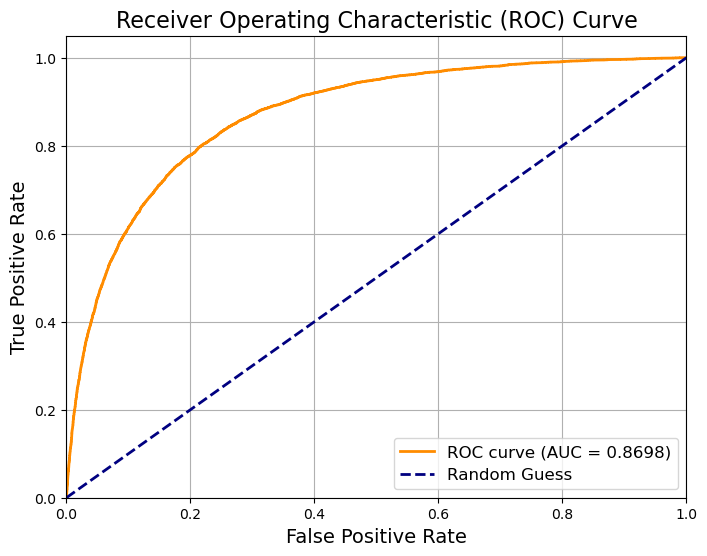

In [4]:

# 3. Define Base Models
# Initialize base models with optimal or recommended parameters

lparams = {}

lparams[0] = {
    'boosting_type': 'gbdt',
    'objective': 'binary',
    'metric': 'auc',
    'learning_rate': 0.01,
    'num_leaves': 200,
    'max_bin': 500,
    'min_child_weight': 0.035,
    'subsample': 0.45,
    'colsample_bytree': 0.3,
    'min_data_in_leaf': 150,
    'max_depth': -1,
    'reg_alpha': 0.4,
    'reg_lambda': 0.7,
    'verbose': 1,
    'random_state': 0,  # Combining seed and bagging_seed for reproducibility
    'n_jobs': -1,
    'n_estimators': 30000
}


base_models = [
    ('xgb', xgb.XGBClassifier(
        objective='binary:logistic',
        eval_metric='auc',
        n_estimators=100,
        learning_rate=0.1,
        max_depth=6,
        random_state=42
    )),
    ('lgbm', lgb.LGBMClassifier(**lparams[0])
     
    ),
    ('catboost', cb.CatBoostClassifier(
        iterations=100,
        learning_rate=0.1,
        depth=6,
        verbose=0,
        random_state=42
    )),
    ('rf', RandomForestClassifier(
        n_estimators=100,
        max_depth=10,
        random_state=42
    ))
]

# 4. Define the Meta-Model
meta_model = LogisticRegression(
    solver='lbfgs',
    max_iter=1000,
    random_state=42
)

# 5. Create the Stacking Ensemble
stacking_clf = StackingClassifier(
    estimators=base_models,
    final_estimator=meta_model,
    passthrough=True,  # Meta-model uses only base model predictions
    n_jobs=-1
)



# 7. Fit the Stacked Ensemble on Training Data
print("\nTraining the Stacked Ensemble...")
stacking_clf.fit(X_train, y_train)
print("Training completed.")

# 8. Predict Probabilities on the Test Set
y_pred_proba = stacking_clf.predict_proba(X_test)[:, 1]

# 9. Calculate AUC-ROC Score
test_auc = roc_auc_score(y_test, y_pred_proba)
print(f"\nTest AUC-ROC: {test_auc:.4f}")

# 10. Predict Class Labels Based on Threshold (0.5)
y_pred = (y_pred_proba >= 0.5).astype(int)

# 11. Display Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 12. Plot the ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=16)
plt.legend(loc="lower right", fontsize=12)
plt.grid(True)
plt.show()